In [1]:
"""
Sergi Caelles (scaelles@vision.ee.ethz.ch)

This file is part of the OSVOS paper presented in:
    Sergi Caelles, Kevis-Kokitsi Maninis, Jordi Pont-Tuset, Laura Leal-Taixe, Daniel Cremers, Luc Van Gool
    One-Shot Video Object Segmentation
    CVPR 2017
Please consider citing the paper if you use this code.
"""
import os
import sys
import time
from PIL import Image, ImageDraw
import numpy as np
import tensorflow as tf
slim = tf.contrib.slim
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
# Import OSVOS files
# root_folder = os.path.dirname(os.path.realpath(__file__))
# sys.path.append(os.path.abspath(root_folder))
import osvosOriginal as osvos
from dataset import Dataset
# os.chdir(root_folder)

In [2]:
# User defined parameters
seq_name = "bmx-trees"
file_name = seq_name+"singledotr10-500ite"
gpu_id = 0
train_model = True 
#result_path = os.path.join('DAVIS', 'Results', 'Segmentations', '480p', 'OSVOS', seq_name)

result_path = os.path.join('DAVIS', 'Results', 'Segmentations', '480p', 'OSVOS', file_name)


Started loading files...
Performing the data augmentation
Done initializing Dataset
Init variable
Initializing from specified pre-trained model...
INFO:tensorflow:Restoring parameters from models/OSVOS_parent/OSVOS_parent.ckpt-50000
Weights initialized
Start training


2018-04-19 11:35:59.032765 Iter 10: Training Loss = 53.4027
2018-04-19 11:36:04.877777 Iter 20: Training Loss = 22.8305
2018-04-19 11:36:10.408593 Iter 30: Training Loss = 65.9553
2018-04-19 11:36:15.646900 Iter 40: Training Loss = 71.8475
2018-04-19 11:36:21.143426 Iter 50: Training Loss = 9.2877
2018-04-19 11:36:26.837396 Iter 60: Training Loss = 8.5199
2018-04-19 11:36:32.582165 Iter 70: Training Loss = 36.9142
2018-04-19 11:36:37.499780 Iter 80: Training Loss = 7.3194
2018-04-19 11:36:43.235336 Iter 90: Training Loss = 21.2978
2018-04-19 11:36:48.879942 Iter 100: Training Loss = 19.7851
2018-04-19 11:36:54.381190 Iter 110: Training Loss = 26.2363
2018-04-19 11:36:59.560697 Iter 120: Training Loss = 24.6425
2018-04-19 11:37:05.236777 Iter 130: Training Loss = 18.2611
2018-04-19 11:37:10.188773 Iter 140: Training Loss = 5.6404
2018-04-19 11:37:15.888346 Iter 150: Training Loss = 5.4770
2018-04-19 11:37:21.082995 Iter 160: Training Loss = 22.4761
2018-04-19 11:37:26.572376 Iter 170: T

INFO:tensorflow:models/bmx-treessingledotr10-500ite/bmx-trees.ckpt-500 is not in all_model_checkpoint_paths. Manually adding it.
Model saved in file: models/bmx-treessingledotr10-500ite/bmx-trees.ckpt-500
Finished training.
duration: 292.422
INFO:tensorflow:Restoring parameters from models/bmx-treessingledotr10-500ite/bmx-trees.ckpt-500
Saving DAVIS/Results/Segmentations/480p/OSVOS/bmx-treessingledotr10-500ite/00000.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/bmx-treessingledotr10-500ite/00001.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/bmx-treessingledotr10-500ite/00002.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/bmx-treessingledotr10-500ite/00003.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/bmx-treessingledotr10-500ite/00004.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/bmx-treessingledotr10-500ite/00005.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/bmx-treessingledotr10-500ite/00006.png
Saving DAVIS/Results/Segmentations/480p/OSVOS/bmx-treessingledotr1

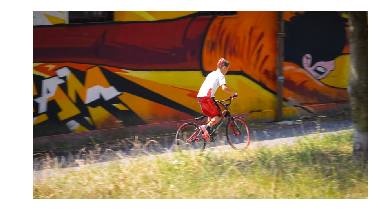

frame 1


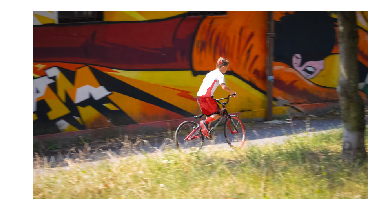

frame 2


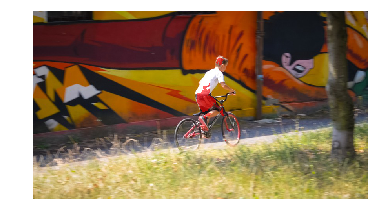

frame 3


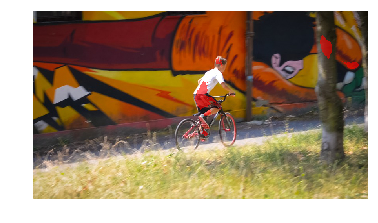

frame 4


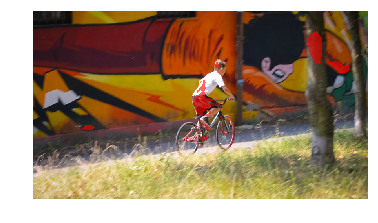

frame 5


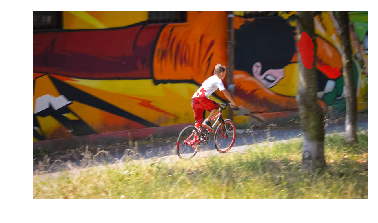

frame 6


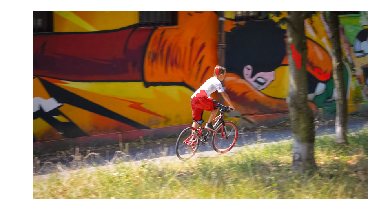

frame 7


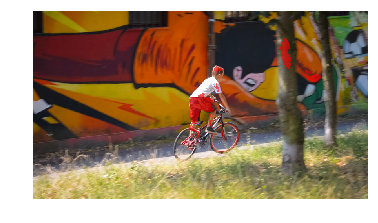

frame 8


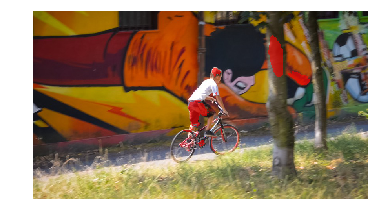

frame 9


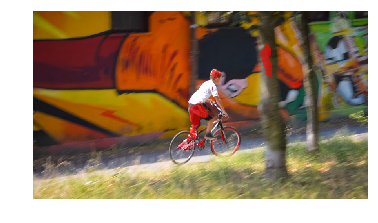

frame 10


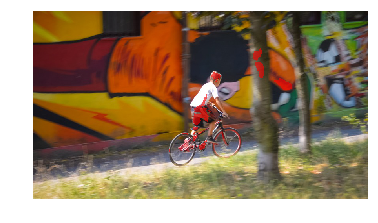

frame 11


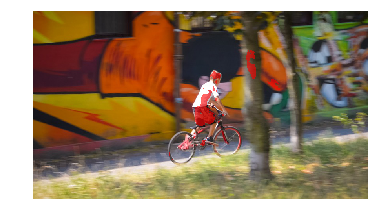

frame 12


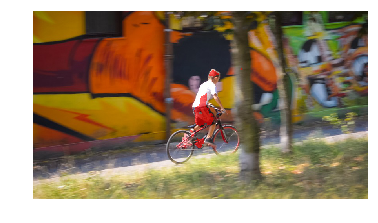

frame 13


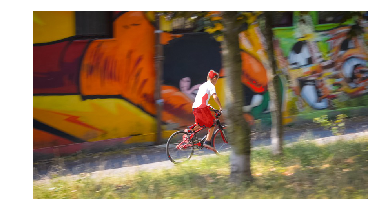

frame 14


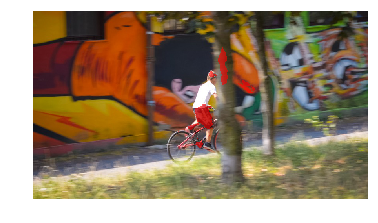

frame 15


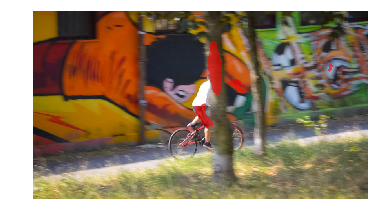

frame 16


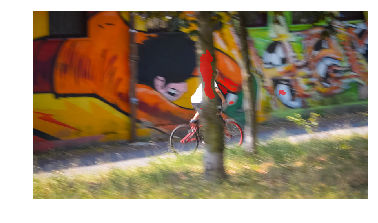

frame 17


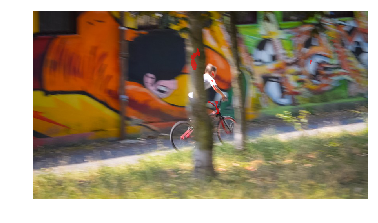

frame 18


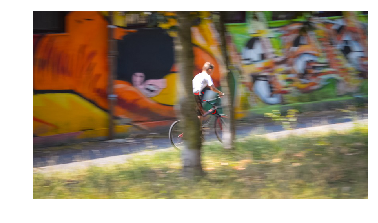

frame 19


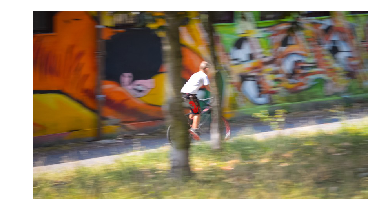

frame 20


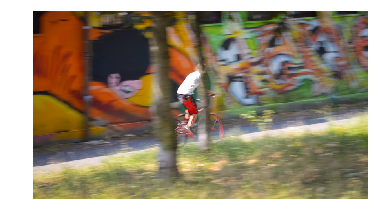

frame 21


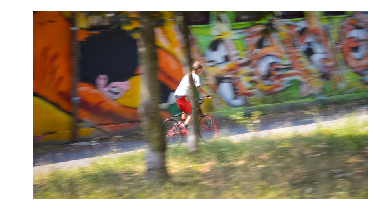

frame 22


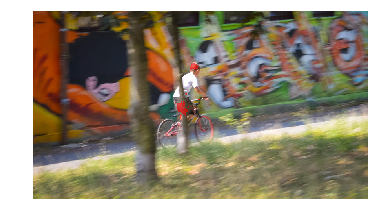

frame 23


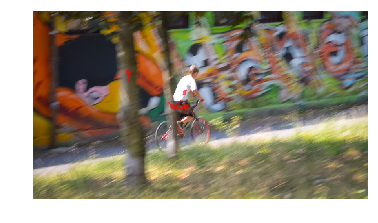

frame 24


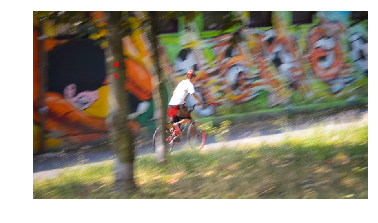

frame 25


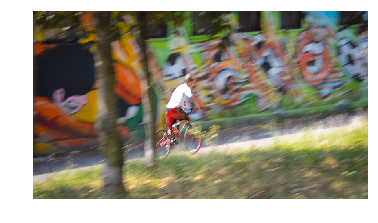

frame 26


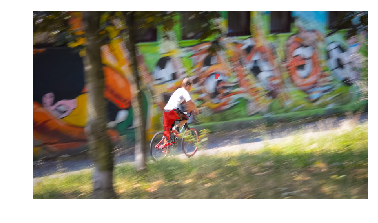

frame 27


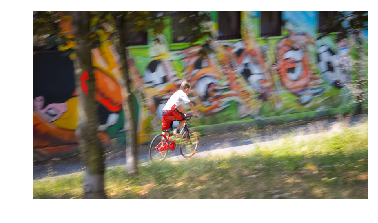

frame 28


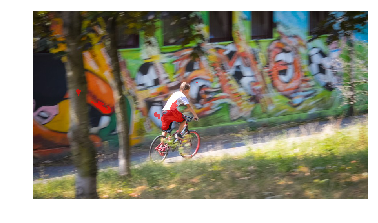

frame 29


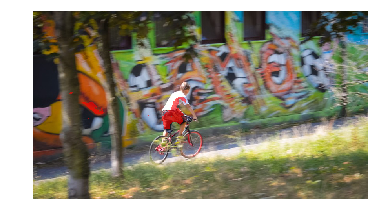

frame 30


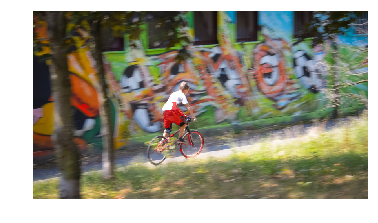

frame 31


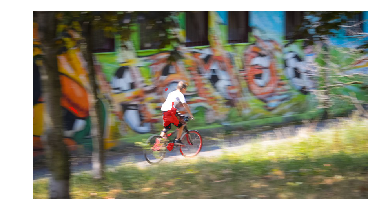

frame 32


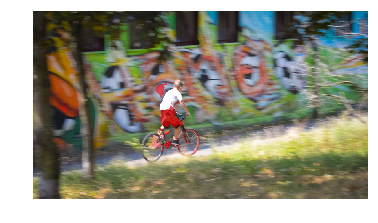

frame 33


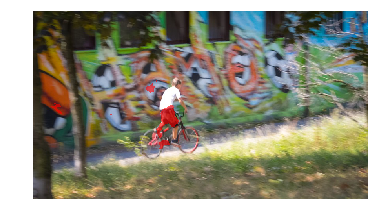

frame 34


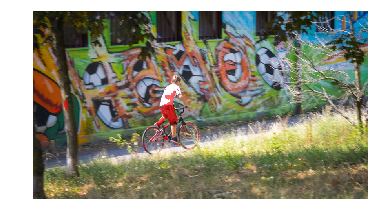

frame 35


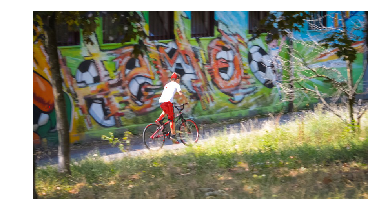

frame 36


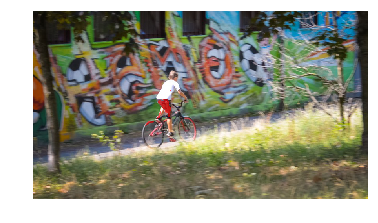

frame 37


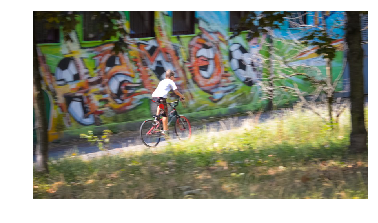

frame 38


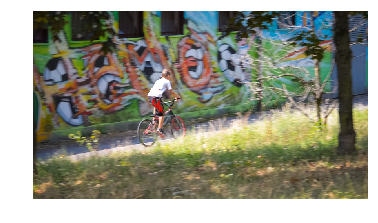

frame 39


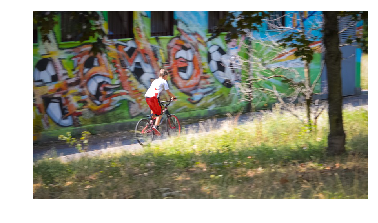

frame 40


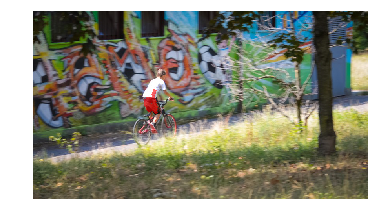

frame 41


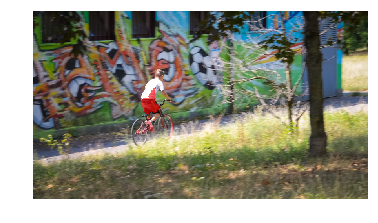

frame 42


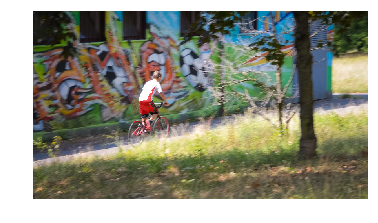

frame 43


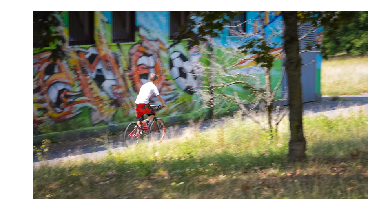

frame 44


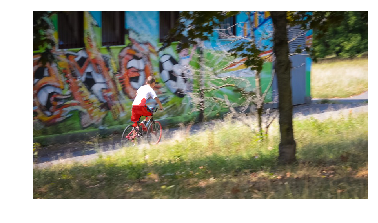

frame 45


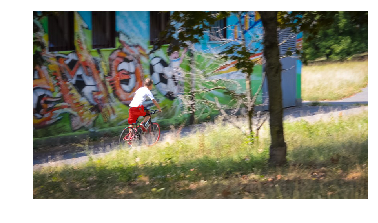

frame 46


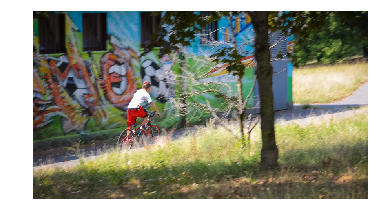

frame 47


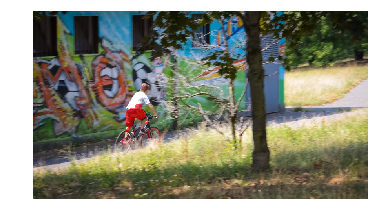

frame 48


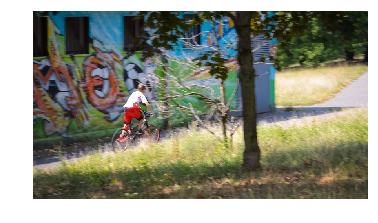

frame 49


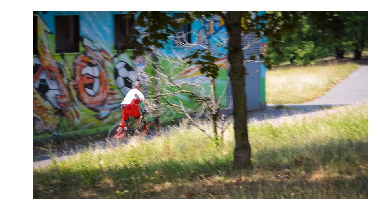

frame 50


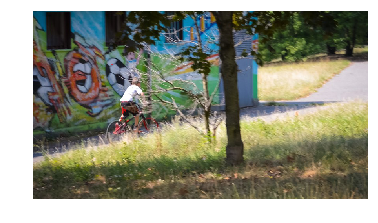

frame 51


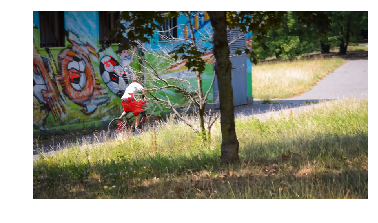

frame 52


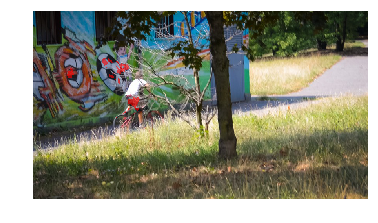

frame 53


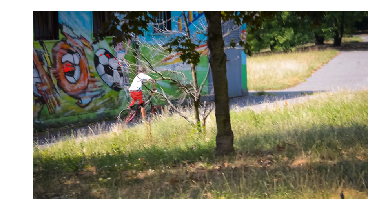

frame 54


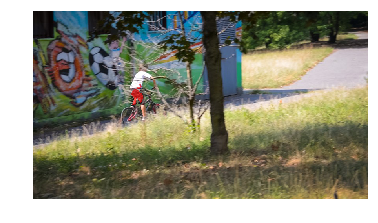

frame 55


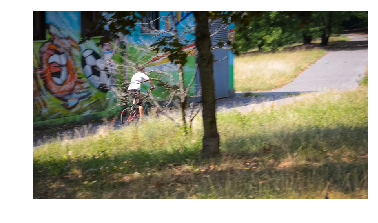

frame 56


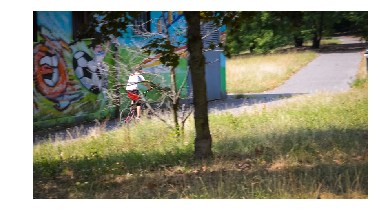

frame 57


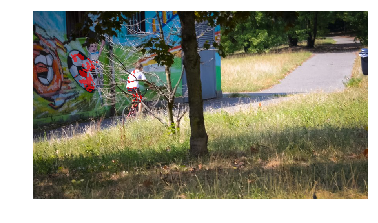

frame 58


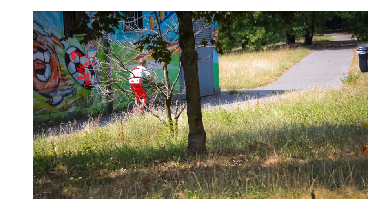

frame 59


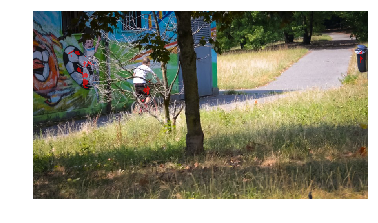

frame 60


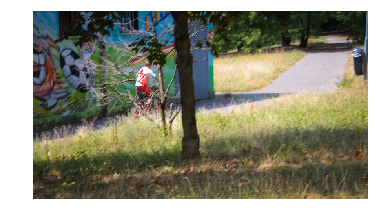

frame 61


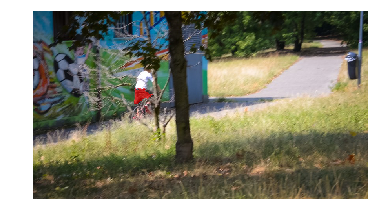

frame 62


/usr/local/lib/python2.7/dist-packages/ipykernel_launcher.py:58: RuntimeWarning: divide by zero encountered in divide


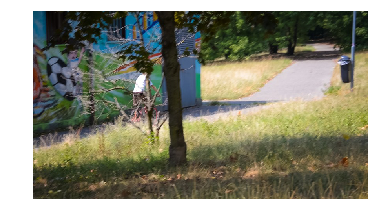

frame 63


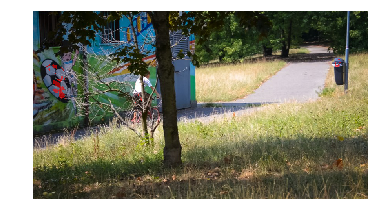

frame 64


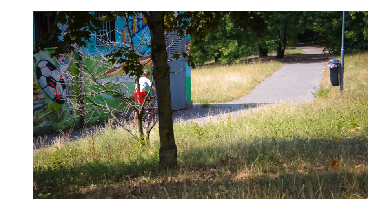

frame 65


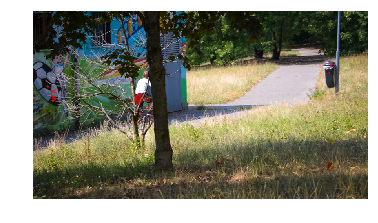

frame 66


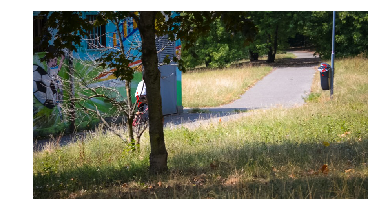

frame 67


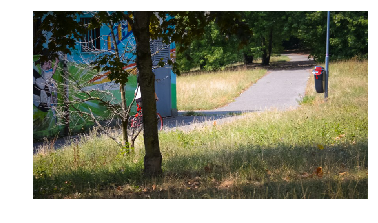

frame 68


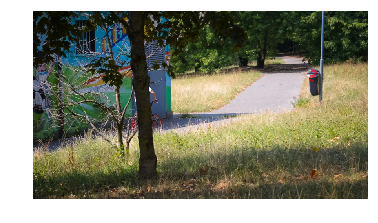

frame 69


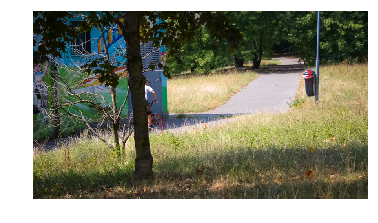

frame 70


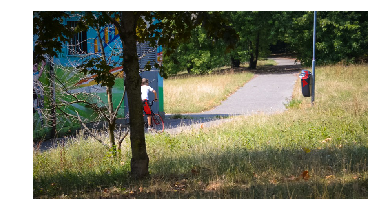

frame 71


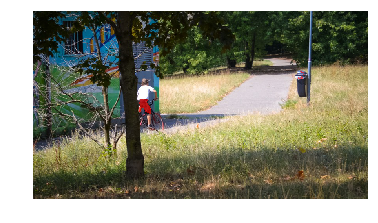

frame 72


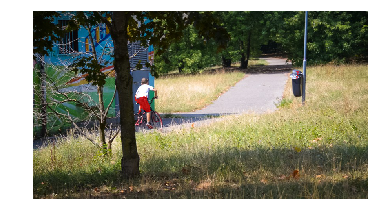

frame 73


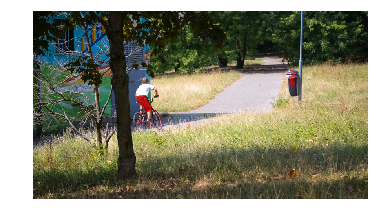

frame 74


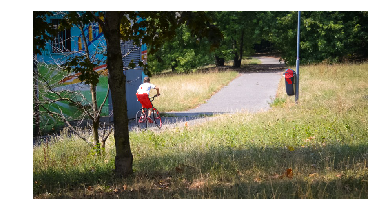

frame 75


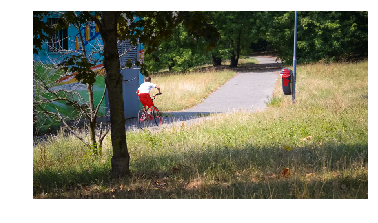

frame 76


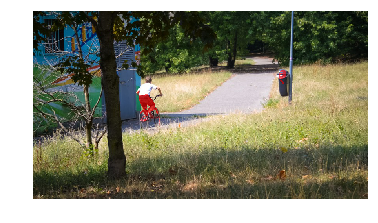

frame 77


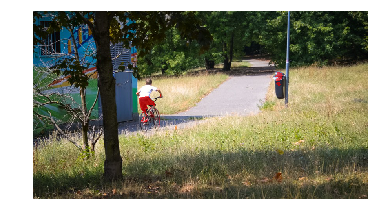

frame 78


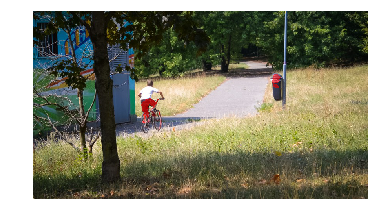

frame 79


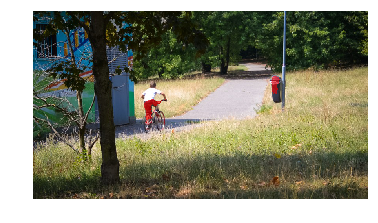

In [3]:


# Train parameters
parent_path = os.path.join('models', 'OSVOS_parent', 'OSVOS_parent.ckpt-50000')
#logs_path = os.path.join('models', seq_name)

logs_path = os.path.join('models', file_name)
max_training_iters = 500


# Define Dataset
test_frames = sorted(os.listdir(os.path.join('DAVIS', 'JPEGImages', '480p', seq_name)))
test_imgs = [os.path.join('DAVIS', 'JPEGImages', '480p', seq_name, frame) for frame in test_frames]
if train_model:
    train_imgs = [os.path.join('DAVIS', 'JPEGImages', '480p', seq_name, '00000.jpg')+' '+
                  #os.path.join('DAVIS', 'Annotations', '480p', seq_name, '00000.png')]
                  #os.path.join('DAVIS', 'Results', 'Segmentations', '480p', 'OSVOS', seq_name+'20', '00000.png')]
                  os.path.join('DAVIS', 'Annotations', 'scribble', 'bmx-treessingledotr10', '00000.png')]
    dataset = Dataset(train_imgs, test_imgs, './', data_aug=True)
else:
    dataset = Dataset(None, test_imgs, './')

# Train the network
if train_model:
    # More training parameters
    learning_rate = 1e-8
    save_step = max_training_iters
    side_supervision = 3
    display_step = 10
    duration = 0
    with tf.Graph().as_default():
        with tf.device('/gpu:' + str(gpu_id)):
            global_step = tf.Variable(0, name='global_step', trainable=False)
            start = time.time()
            osvos.train_finetune(dataset, parent_path, side_supervision, learning_rate, logs_path, max_training_iters,
                                 save_step, display_step, global_step, iter_mean_grad=1, ckpt_name=seq_name, resume_training=False)
            duration = time.time()-start 
            print "duration: %.3f" % duration

# Test the network
with tf.Graph().as_default():
    with tf.device('/gpu:' + str(gpu_id)):
        #checkpoint_path = os.path.join('models', seq_name, seq_name+'.ckpt-'+str(max_training_iters))
        checkpoint_path = os.path.join('models', file_name, seq_name+'.ckpt-'+str(max_training_iters))
        osvos.test(dataset, checkpoint_path, result_path)

# Show results
overlay_color = [255, 0, 0]
transparency = 0.6
plt.ion()
counter = 0
for img_p in test_frames:
    print "frame %d" % counter
    counter += 1
    frame_num = img_p.split('.')[0]
    img = np.array(Image.open(os.path.join('DAVIS', 'JPEGImages', '480p', seq_name, img_p)))
    mask = np.array(Image.open(os.path.join(result_path, frame_num+'.png')))
    mask = mask/np.max(mask)
    im_over = np.ndarray(img.shape)
    im_over[:, :, 0] = (1 - mask) * img[:, :, 0] + mask * (overlay_color[0]*transparency + (1-transparency)*img[:, :, 0])
    im_over[:, :, 1] = (1 - mask) * img[:, :, 1] + mask * (overlay_color[1]*transparency + (1-transparency)*img[:, :, 1])
    im_over[:, :, 2] = (1 - mask) * img[:, :, 2] + mask * (overlay_color[2]*transparency + (1-transparency)*img[:, :, 2])
    plt.imshow(im_over.astype(np.uint8))
    plt.axis('off')
    plt.show()
    plt.pause(0.01)
    plt.clf()
    


In [ ]:
# show predictions

#seq_name = "parkour"
#result_path = os.path.join('DAVIS', 'Results', 'Segmentations', '480p', 'OSVOS', seq_name)
for imgFile in sorted(os.listdir(result_path)):
    if (imgFile.endswith('.png')):
        img=mpimg.imread(result_path+ '/' +imgFile)
        imgplot = plt.imshow(img)
        plt.show()

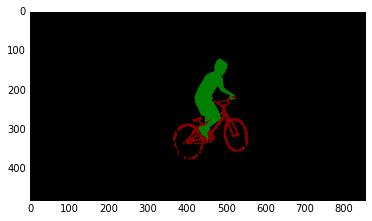

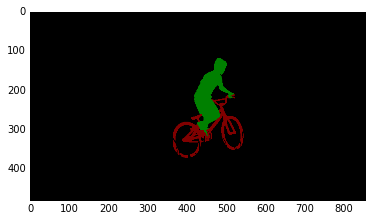

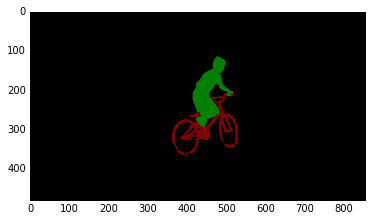

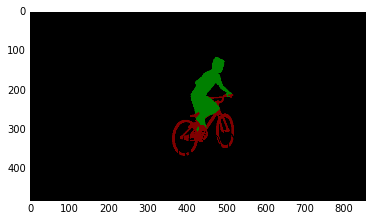

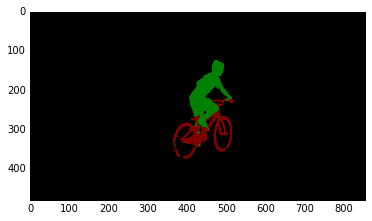

...

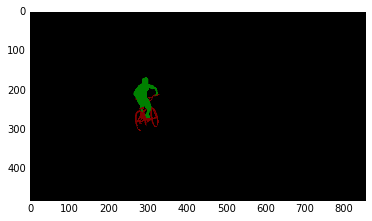

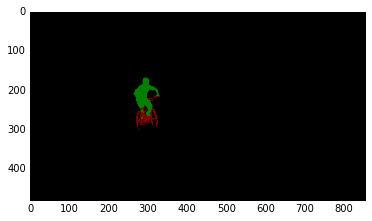

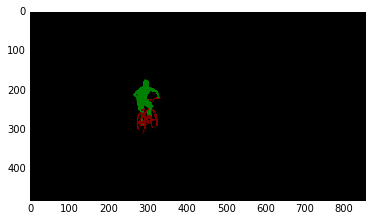

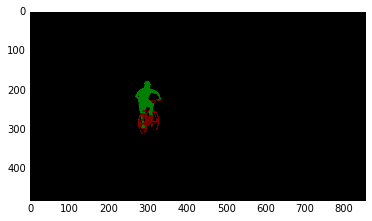

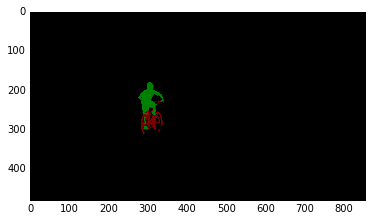

In [5]:
# show GT

#seq_name = "parkour"
ScribbleGT_path = os.path.join('DAVIS', 'Annotations', 'scribble', file_name)
GT_path = os.path.join('DAVIS', 'Annotations', '480p', seq_name)
#GT_path = ScribbleGT_path

for imgFile in sorted(os.listdir(GT_path)):
    if (imgFile.endswith('.png')):
        img=mpimg.imread(GT_path+ '/' +imgFile)
        imgplot = plt.imshow(img)
        plt.show()
        